# Igraph - Network Analysis - Notebook
*by*: **Nikolaj Krebs Pedersen - nped@itu.dk**

This notebook explores the tool of Igraph to be used for Network Analysis.
For this notebook, we will start by showing the process of using Igraph to create and visualize a simple graph. Following that we will look at the case dataset and try and use Network Analysis to explore the data.

### Overview of Network Analysis terminology:
https://sites.google.com/a/umn.edu/social-network-analysis/terminology

### Igraph tutorial:
https://igraph.org/python/tutorial/latest/tutorial.html

In [67]:
#pip install igraph
#pip install pycairo

In [68]:
import igraph as ig
import pandas as pd
from sklearn import preprocessing
import numpy as np
import cairo


In [69]:
g = ig.Graph() #Instantiation of an empty graph

In [70]:
#Input into the graph
g = ig.Graph(n=10,                   #"n" determines the number of nodes
             edges=[[0, 1], [0, 5]]) #create edges between node 0 and 1 & node 0 and 5

In igraph, vertices are always numbered up from zero. The number of a vertex is called the vertex ID. A vertex might or might not have a name.

In [71]:
#Two ways to get a summary of the graph
print('print(g): ')
print(g)                           #Lists both vertices(nodes) and edges (connections) between vertices
print('g.summary(): ')
g.summary()                        #List only number of vertices (nodes)

print(g): 
IGRAPH U--- 10 2 --
+ edges:
0--1 0--5
g.summary(): 


'IGRAPH U--- 10 2 -- '

In [72]:
g.add_vertices(2)                  #adds two new vertices to the graph
print(g)

IGRAPH U--- 12 2 --
+ edges:
0--1 0--5


In [73]:
g.add_edges([(2, 3), (3, 4), (4, 5), (5, 3)])     #adds new edges between vertices
print(g)

IGRAPH U--- 12 6 --
+ edges:
0--1 0--5 2--3 3--4 4--5 3--5


In [48]:
g.get_eid(2,3) #Retrieve the ID of the given edge

2

In [49]:
g.delete_edges(3) #Removes edges based on ID
print(g)

IGRAPH U--- 12 5 --
+ edges:
0--1 0--5 2--3 4--5 3--5


In [50]:
g.delete_edges(g.get_eid(3,5)) #You can combine the two for easy use
print(g)

IGRAPH U--- 12 4 --
+ edges:
0--1 0--5 2--3 4--5


In [51]:
g.delete_vertices(2) #Removes vertices based on ID
print(g)

IGRAPH U--- 11 3 --
+ edges:
0--1 0--4 3--4


In [52]:
edge_list = g.get_edgelist() #Create a list of edges from a graph
edge_list

[(0, 1), (0, 4), (3, 4)]

In [53]:
g2 = ig.Graph([(0,1), (0,2), (2,3), (3,4), (4,2), (2,5), (5,0), (6,3), (5,6)])
#Graph can also be created by just providing the edges. iGraph will then calculate the number of vertices itself
print(g2)

IGRAPH U--- 7 9 --
+ edges:
0 -- 1 2 5     2 -- 0 3 4 5   4 -- 2 3       6 -- 3 5
1 -- 0         3 -- 2 4 6     5 -- 0 2 6


Through iGraph you also add attributes.
Through .vs (vertices) and .es (edges) iGraph creates dictionaries that contain values for different attributes. The order in which values are presented in the dictionary following the ID of vertices or edges.

In [54]:
g2.vs["name"] = ["Alice", "Bob", "Claire", "Dennis", "Esther", "Frank", "George"]
g2.vs["age"] = [25, 31, 18, 47, 22, 23, 50]
g2.vs["gender"] = ["f", "m", "f", "m", "f", "m", "m"]
g2.es["is_formal"] = [False, False, True, True, True, False, True, False, False]

Example:

vertex ID 3: Name = Dennis, Age = 47, Gender = m

edge between 2 and 3: is_formal = False

In [55]:
print(g2)

IGRAPH UN-- 7 9 --
+ attr: age (v), gender (v), name (v), is_formal (e)
+ edges (vertex names):
 Alice -- Bob, Claire, Frank             Esther -- Claire, Dennis
   Bob -- Alice                           Frank -- Alice, Claire, George
Claire -- Alice, Dennis, Esther, Frank   George -- Dennis, Frank
Dennis -- Claire, Esther, George


In [56]:
g2.vs[0]

igraph.Vertex(<igraph.Graph object at 0x00000175E8E91E40>, 0, {'name': 'Alice', 'age': 25, 'gender': 'f'})

The degree of a vertex equals the number of edges adjacent to it.

In [57]:
g2.degree() #Calculates all degress for all edges in the graph

[3, 1, 4, 3, 2, 3, 2]

In [58]:
g2.degree(6) #Calculates the degree of one vertex - based on ID

2

In [59]:
g2.degree("George") #Calculate the degree of one vertex - based on "name" attribute

2

In [60]:
g2.degree([2,3,4]) #Calculate the degrees for a subset of vertices - based on ID

[4, 3, 2]

In [61]:
x = g2.vs.select(age_lt=30) #create a list of all vertices that
len(x)

4

## Igraph plotting:
through the library: pyCairo we can plot graphs to visualize edges and vertices.

There are a number of different layouts that can be used by the pyCairo library to visualize graphs. Some might look familiar from Gephi.


| Method name | Short name | Algorithm description |
| --- | --- | --- |
| layout_circle | circle, circular | Deterministic layout that places the vertices on a circle |
| layout_drl | drl | The Distributed Recursive Layout algorithm for large graphs |
| layout_fruchterman_reingold | fr | Fruchterman-Reingold force-directed algorithm |
| layout_fruchterman_reingold_3d | fr3d, fr_3d | Fruchterman-Reingold force-directed algorithm in three dimensions |
| layout_kamada_kawai | kk | Kamada-Kawai force-directed algorithm |
| layout_kamada_kawai_3d | kk3d, kk_3d | Kamada-Kawai force-directed algorithm in three dimensions |
| layout_lgl | large, lgl, large_graph | The Large Graph Layout algorithm for large graphs |
| layout_random | random | Places the vertices completely randomly |
| layout_random_3d | random_3d | Places the vertices completely randomly in 3D |
| layout_reingold_tilford | rt, tree | Reingold-Tilford tree layout, useful for (almost) tree-like graphs |
| layout_reingold_tilford_circular | rt_circular tree | Reingold-Tilford tree layout with a polar coordinate post-transformation, useful for (almost) tree-like graphs |
| layout_sphere | sphere, spherical, circular_3d | Deterministic layout that places the vertices evenly on the surface of a sphere |




In [62]:
l1 = g2.layout('circle')
l2 = g2.layout('drl')
l3 = g2.layout('fr')
l4 = g2.layout('kk')
l5 = g2.layout('random')
l6 = g2.layout('rt')
l7 = g2.layout('rt_circular')

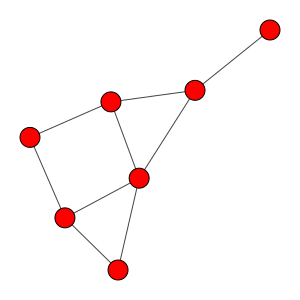

In [63]:
ig.plot(g2, layout=l3, bbox=(300,300), #Bounding box of the plot (width,height)
        margin=30) #the margins in which you want to plot the graph

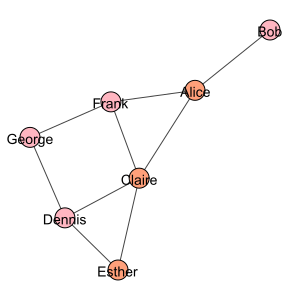

In [64]:
g2.vs['label'] = g2.vs['name'] #Make a new attribute called label that is the same as the name attribute
color_dict = {'m': 'light pink', 'f': 'light salmon'} #Make a directory that contains colors for male(m) and female (f)
g2.vs['color'] = [color_dict[gender] #creates a new variable for the dictionary
                for gender in g2.vs['gender']] #and adds the values from the vertex attribute gender

ig.plot(g2,layout=l3,bbox = (300,300),margin=30) #plot graph

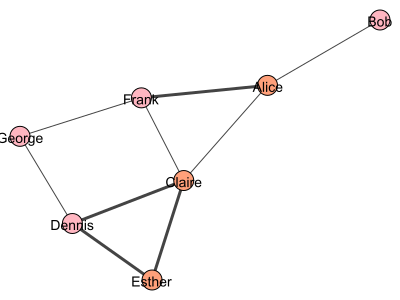

In [65]:
visual_style = {}
visual_style["vertex_size"] = 20 #Size of vertices
visual_style["vertex_color"] = [color_dict[gender] for gender in g2.vs["gender"]] #functions as before mentioned where you you change color based on gender
visual_style["vertex_label"] = g2.vs["name"] #Set the label to the "name" attribute
visual_style["edge_width"] = [1 + 2 * int(is_formal) for is_formal in g2.es["is_formal"]] #change the width of edges based on the "is_formal" attribute
visual_style["layout"] = l3
visual_style["bbox"] = (400, 300)
visual_style["margin"] = 20
ig.plot(g2, **visual_style)

## Igraph Plot Cheat sheet ;) :
These can also be found in the Igraph tutorial

### Igraph plot Vertex:
| Attribute name | Keyword argument | Purpose |
| --- | --- | --- |
| color | vertex_color | color of the vertex |
| font | vertex_font | font of the vertex |
| label | vertex_label | label of the vertex |
| label_angle | vertex_label_angle | the placement of the vertex label on the circle around the vertex. This is an angle in radians, with zero belonging to the right side of the vertex. |
| label_color | vertex_label_color | color of the vertex label |
| label_dist | vertex_label_dist | distance of the vertex label from the vertex itself, relative to the vertex size |
| label_size | vertex_label_size | font size of the vertex label |
| order | vertex_order | drawing order of the vertices. Vertices with a smaller order parameter will be drawn first. |
| shape | vertex_shape | shape of the vertex. Known shapes are: rectangle, circle, hidden, triangle-up, triangle-down. |
| size | vertex_size | size of the vertex in pixels |


### Igraph plot Edge:
| Attribute name | Keyword argument | Purpose |
| --- | --- | --- |
| color | edge_color | color of the edge |
| curved | edge_curved | the curvature of the edge. Positive values correspond to edges curved in CCW direction, negative numbers correspond to edges curved in clockwise (CW) direction. Zero represents straight edges. True is interpreted as 0.5, False is interpreted as zero. This is useful to make multiple edges visible. See also the autocurve keyword argument to plot(). |
| font | edge_font | font family of the edge |
| arrow_size | edge_arrow_size | size (length) of the arrowhead on the edge if the graph is directed, relative to 15 pixels. |
| arrow_width | edge_arrow_width | Width of the arrowhead on the edge if the graph is directed, relative to 10 pixels. |
| width | edge_width | Width of the edge in pixels |
| label | edge_label | if specified, it adds a label to the edge. |
| background | edge_background | if specified, it adds a rectangular box around the edge label, of the specified color (matplotlib only). |
| align_label | edge_align_label | If True, rotate the edge label such that it aligns with the edge direction. Labels that would be upside-down are flipped (matplotlib only). |

# Igraph - Case Example
We will now try and use network analysis to investigate the relationship between the addresses of Worksite and Supplier

In [ ]:
#Load dataset
file = r'C:\Users\KIM\OneDrive\Skrivebord\Research Assistant\Data Science Case Tabular Data DSV-T.xlsx'
df = pd.read_excel(file)
df

,OrderNumber,Department,CustomerNumber,CustomerName,DeliveryDate,DeliveryTime,WorksiteNumber,WorksiteName,WorksiteAddressName,WorksiteAddress1,...,Quantity,Unit,Direction,SupplierAddressName,SupplierAddress1,SupplierZip,SupplierCity,SupplierAddress3,SupplierCountry,SupplierGPS
0,10241482,Volumen,1980,Nordsj. Andels Grovvareforening A.M.B.A,20220103,03/01 07:00 Præcis,1914,1980-8,NaN,NAG Dønnevælde,...,34.32,Ton,Start Supplier,Kalundborg Havn,Kalundborg Bulk Terminal,4400,Kalundborg,,DK,NaN
1,10241498,Volumen,1980,Nordsj. Andels Grovvareforening A.M.B.A,20220103,03/01 07:00 Præcis,1914,1980-8,NaN,NAG Dønnevælde,...,36.36,Ton,Start Supplier,Kalundborg Havn,Kalundborg Bulk Terminal,4400,Kalundborg,,DK,NaN
2,10241217,Entreprenør,4334,Munck Havne & Anlæg A/S,20220103,07:00,49788,4334-2010,NaN,"Mole 240, Risø",...,37.65,Ton,Start Supplier,"Nymølle, Hedehusene",Vestre Hedevej 25,4000,Roskilde,,DK,NaN
3,10237819,Entreprenør,10101,DSV Transport A/S entrepr.401,20220103,07:00,3418,10101-1,NaN,Div. betalt på afd. 101,...,1.50,Timer,Start Worksite,DSV Transport A/S,Gammel Marbjergvej 17,4000,Roskilde,,DK,NaN
4,10241687,Entreprenør,10101,DSV Transport A/S entrepr.401,20220103,19:43,3418,10101-1,NaN,Div. betalt på afd. 101,...,1.00,Timer,Start Supplier,DSV Transport A/S entrepr.401,Div. betalt på afd. 101,9999,NaN,,DK,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2244,10296110,Entreprenør,383,MT Højgaard Danmark A/S,20220228,06:30,47889,383-61235,NaN,"Vandkulturhuset, Papirøen",...,36.60,Ton,Start Supplier,"Nymølle, Hedehusene",Vestre Hedevej 25,4000,Roskilde,,DK,NaN
2245,10295786,Entreprenør,1103,M.J. Eriksson Aktieselskab,20220228,16:59,47772,1103-2134,NaN,"Værker ved Gevninge, Skullebjerg/Godtfreds Høje",...,36.96,Ton,Start Supplier,Roskilde Sten & Grus ApS,Øde Hastrupvej 48,4000,Roskilde,,DK,NaN
2246,10297093,Entreprenør,71320,Tunn3l JV I/S,20220228,ENO 07:30,44386,71320-52204,Mozarts Pl. 3,Borgmester Christiansens gade 41,...,7.50,Timer,Start Worksite,DSV Transport A/S,Gammel Marbjergvej 17,4000,Roskilde,,DK,NaN
2247,10297096,Entreprenør,71320,Tunn3l JV I/S,20220228,ENO 07:30,44386,71320-52204,Mozarts Pl. 3,Borgmester Christiansens gade 41,...,9.50,Timer,Start Worksite,DSV Transport A/S,Gammel Marbjergvej 17,4000,Roskilde,,DK,NaN


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2249 entries, 0 to 2248
Data columns (total 35 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   OrderNumber            2249 non-null   int64  
 1   Department             2249 non-null   object 
 2   CustomerNumber         2249 non-null   int64  
 3   CustomerName           2249 non-null   object 
 4   DeliveryDate           2249 non-null   int64  
 5   DeliveryTime           2249 non-null   object 
 6   WorksiteNumber         2249 non-null   int64  
 7   WorksiteName           2249 non-null   object 
 8   WorksiteAddressName    885 non-null    object 
 9   WorksiteAddress1       2249 non-null   object 
 10  WorksiteAddress2       2239 non-null   object 
 11  WorksiteAddress3       0 non-null      float64
 12  WorksiteZip            2249 non-null   object 
 13  WorksiteCity           1811 non-null   object 
 14  WorksiteCountry        2249 non-null   object 
 15  Work

First i start by creating a subset of the dataframe. These are picked with a focus around the number of data points and information.
For example it might be interesting to look at "WorksiteGPS" - but there is only 20 instances within the dataframe.

In [ ]:
subset = df[['WorksiteAddress1', 'SupplierAddress1','WorksiteZip','SupplierZip', 'ProductNumber', 'VehicleType', 'CustomerName', 'SupplierCity']]
subset = subset.dropna() # drop all nan values
subset

,WorksiteAddress1,SupplierAddress1,WorksiteZip,SupplierZip,ProductNumber,VehicleType,CustomerName,SupplierCity
0,NAG Dønnevælde,Kalundborg Bulk Terminal,3230,4400,4100000,07S,Nordsj. Andels Grovvareforening A.M.B.A,Kalundborg
1,NAG Dønnevælde,Kalundborg Bulk Terminal,3230,4400,4100000,07S,Nordsj. Andels Grovvareforening A.M.B.A,Kalundborg
2,"Mole 240, Risø",Vestre Hedevej 25,4000,4000,540030,07S,Munck Havne & Anlæg A/S,Roskilde
3,Div. betalt på afd. 101,Gammel Marbjergvej 17,3540,4000,120099,7KJ,DSV Transport A/S entrepr.401,Roskilde
5,Selinevej 20,Elektrovej 4,2300,4700,965010,07S,Afatek A/S,Næstved
...,...,...,...,...,...,...,...,...
2244,"Vandkulturhuset, Papirøen",Vestre Hedevej 25,1438,4000,506030,07S,MT Højgaard Danmark A/S,Roskilde
2245,"Værker ved Gevninge, Skullebjerg/Godtfreds Høje",Øde Hastrupvej 48,4000,4000,524010,07S,M.J. Eriksson Aktieselskab,Roskilde
2246,Borgmester Christiansens gade 41,Gammel Marbjergvej 17,2450,4000,170000,07S,Tunn3l JV I/S,Roskilde
2247,Borgmester Christiansens gade 41,Gammel Marbjergvej 17,2450,4000,170000,07S,Tunn3l JV I/S,Roskilde


To find a way of creating the dataframe into a graph, that contains vertices (WorksiteAddress1 & SupplierAddress1) and edges (how these are connected).
I looked at the Igraph API to find a method that would allow me to do so. Here i found: .TupleList()

To use this we would first have to create a tuple. This is very similar to a list, however, it can not be manipulated with.

Igraph API:
https://igraph.org/python/api/latest/

Igraph generate graph from dataframe:
https://igraph.org/python/tutorial/latest/generation.html

In [ ]:
tuples = [tuple(x) for x in subset.values] #create the dataset into a tuple

In [ ]:
tuples

[('NAG Dønnevælde',
  'Kalundborg Bulk Terminal',
  3230,
  4400,
  4100000,
  '07S',
  'Nordsj. Andels Grovvareforening A.M.B.A',
  'Kalundborg'),
 ('NAG Dønnevælde',
  'Kalundborg Bulk Terminal',
  3230,
  4400,
  4100000,
  '07S',
  'Nordsj. Andels Grovvareforening A.M.B.A',
  'Kalundborg'),
 ('Mole 240, Risø',
  'Vestre Hedevej 25',
  4000,
  4000,
  540030,
  '07S',
  'Munck Havne & Anlæg A/S',
  'Roskilde'),
 ('Div. betalt på afd. 101',
  'Gammel Marbjergvej 17',
  3540,
  4000,
  120099,
  '7KJ',
  'DSV Transport A/S entrepr.401',
  'Roskilde'),
 ('Selinevej 20',
  'Elektrovej 4',
  2300,
  4700,
  965010,
  '07S',
  'Afatek A/S',
  'Næstved'),
 ('Vestre Hedevej 34',
  'Kraftværksvej 25',
  4000,
  2300,
  657010,
  '7FH',
  'Solum Roskilde A/S',
  'København S'),
 ('Hagesholmvej 7',
  'Kraftværksvej 25',
  ' ',
  2300,
  657010,
  '06S',
  'Solum Roskilde A/S',
  'København S'),
 ('Hagesholmvej 7',
  'Kraftværksvej 25',
  ' ',
  2300,
  657010,
  '7FH',
  'Solum Roskilde A/S',


In [ ]:
#Use the method .TupleList() to create a graph from the before create tuple.
#It takes the first two elements from the list and defines them as vertices.
#The "edge_attrs" takes and makes the remaining elements into attributes. Here you also name them similiarly as graph.es()
g2 = ig.Graph.TupleList(tuples, edge_attrs=['ProductNumber', 'VehicleType', 'CustomerName', 'SupplierCity'])

### Igraph API:
https://igraph.org/python/api/latest/igraph.Graph.html

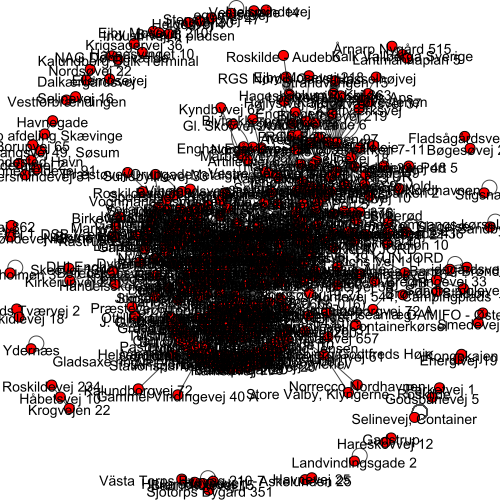

In [ ]:
visual_style = {}
visual_style["vertex_size"] = 10
visual_style["vertex_label"] = g2.vs["name"]
visual_style["bbox"] = (500, 500)
visual_style["margin"] = 10
ig.plot(g2, **visual_style)

Now we have made and visualized a graph that takes and shows the relation between "WorksiteAddress1" and "SupplierAddress1". However it is very difficult to gain any information from this visualization, because of the amount of information that is shown.

First idea to make it more readible is to make numeric values that represent the vertices.

In [ ]:
#Create a list of all address (vertices)
joinedList = list(subset['WorksiteAddress1']) + list(subset['SupplierAddress1'])
joinedList

['NAG Dønnevælde',
 'NAG Dønnevælde',
 'Mole 240, Risø',
 'Div. betalt på afd. 101',
 'Selinevej 20',
 'Vestre Hedevej 34',
 'Hagesholmvej 7',
 'Hagesholmvej 7',
 'Roskildevej 16',
 'Eget køb',
 'Pumpestation, Soldraget 75C',
 'Metalgangen 29, GREVE',
 'Kongekajen',
 'Kongekajen',
 'Kongekajen',
 'Egtoftevej 7',
 'Jordemodervej 38',
 'Industrivænget 2',
 'NAG Dønnevælde',
 'NAG Dønnevælde',
 'Asfaltfabrikken Ejby',
 'Asfaltfabrikken Ejby',
 'Profilvej 22',
 'Grønttorvet, byggefelt 23',
 'Vemmelev',
 'Selinevej 4',
 'Selinevej, Port 4',
 'Selinevej, Port 4',
 'Vemmelev',
 'Vemmelev',
 'Vemmelev',
 'Grønttorvet, byggefelt 23',
 'Cathrinebergvej 1B',
 'Klosterpark Allé',
 'Helseholmen 10, Avedøre',
 'Helseholmen 10, Avedøre',
 'Helseholmen 10, Avedøre',
 'Helseholmen 10, Avedøre',
 'Selinevej 20',
 'Selinevej 20',
 'Selinevej 20',
 'Selinevej 20',
 'Selinevej 20',
 'Ruten 14 ',
 'Wibrandtsvej 66',
 'Torpet 40',
 'Mileparken 23',
 'Mileparken 23',
 'Bybuen 6',
 'Eget Køb',
 'Enghavegårdsve

In [ ]:
#Use LabelEncoder to make the address into numeric values. Then we create a new list with the numeric values
le = preprocessing.LabelEncoder()
fitted_le = le.fit(joinedList)
numList = fitted_le.transform(joinedList)
numList = list(numList)
numList

[215,
 215,
 214,
 54,
 272,
 348,
 116,
 116,
 255,
 64,
 245,
 210,
 179,
 179,
 179,
 65,
 154,
 147,
 215,
 215,
 5,
 5,
 240,
 110,
 341,
 273,
 278,
 278,
 341,
 341,
 341,
 110,
 43,
 178,
 129,
 129,
 129,
 129,
 272,
 272,
 272,
 272,
 272,
 261,
 359,
 327,
 211,
 211,
 35,
 63,
 74,
 72,
 263,
 263,
 33,
 302,
 210,
 302,
 302,
 179,
 179,
 179,
 41,
 37,
 79,
 172,
 215,
 215,
 341,
 277,
 91,
 91,
 278,
 221,
 91,
 341,
 265,
 243,
 340,
 272,
 178,
 178,
 326,
 272,
 272,
 272,
 272,
 272,
 272,
 272,
 95,
 128,
 24,
 92,
 263,
 204,
 263,
 210,
 302,
 302,
 302,
 302,
 293,
 237,
 336,
 172,
 110,
 224,
 144,
 110,
 276,
 278,
 278,
 276,
 91,
 240,
 144,
 276,
 144,
 244,
 61,
 61,
 61,
 340,
 20,
 178,
 178,
 20,
 372,
 55,
 272,
 272,
 272,
 272,
 272,
 272,
 272,
 272,
 272,
 272,
 292,
 211,
 211,
 320,
 368,
 263,
 302,
 302,
 302,
 158,
 158,
 158,
 358,
 272,
 207,
 144,
 224,
 224,
 144,
 144,
 276,
 144,
 144,
 276,
 276,
 280,
 278,
 221,
 276,
 276,
 144,
 27

In [ ]:
#Creates two new columns in the subset that will contain the numeric values
subset_WorksiteNumber = subset
subset_WorksiteNumber['WorksiteAddressNumber'] = subset_WorksiteNumber['WorksiteAddress1']
subset_WorksiteNumber['SupplierAddressNumber'] = subset_WorksiteNumber['SupplierAddress1']
subset_WorksiteNumber

,WorksiteAddress1,SupplierAddress1,WorksiteZip,SupplierZip,ProductNumber,VehicleType,CustomerName,SupplierCity,WorksiteAddressNumber,SupplierAddressNumber
0,NAG Dønnevælde,Kalundborg Bulk Terminal,3230,4400,4100000,07S,Nordsj. Andels Grovvareforening A.M.B.A,Kalundborg,NAG Dønnevælde,Kalundborg Bulk Terminal
1,NAG Dønnevælde,Kalundborg Bulk Terminal,3230,4400,4100000,07S,Nordsj. Andels Grovvareforening A.M.B.A,Kalundborg,NAG Dønnevælde,Kalundborg Bulk Terminal
2,"Mole 240, Risø",Vestre Hedevej 25,4000,4000,540030,07S,Munck Havne & Anlæg A/S,Roskilde,"Mole 240, Risø",Vestre Hedevej 25
3,Div. betalt på afd. 101,Gammel Marbjergvej 17,3540,4000,120099,7KJ,DSV Transport A/S entrepr.401,Roskilde,Div. betalt på afd. 101,Gammel Marbjergvej 17
5,Selinevej 20,Elektrovej 4,2300,4700,965010,07S,Afatek A/S,Næstved,Selinevej 20,Elektrovej 4
...,...,...,...,...,...,...,...,...,...,...
2244,"Vandkulturhuset, Papirøen",Vestre Hedevej 25,1438,4000,506030,07S,MT Højgaard Danmark A/S,Roskilde,"Vandkulturhuset, Papirøen",Vestre Hedevej 25
2245,"Værker ved Gevninge, Skullebjerg/Godtfreds Høje",Øde Hastrupvej 48,4000,4000,524010,07S,M.J. Eriksson Aktieselskab,Roskilde,"Værker ved Gevninge, Skullebjerg/Godtfreds Høje",Øde Hastrupvej 48
2246,Borgmester Christiansens gade 41,Gammel Marbjergvej 17,2450,4000,170000,07S,Tunn3l JV I/S,Roskilde,Borgmester Christiansens gade 41,Gammel Marbjergvej 17
2247,Borgmester Christiansens gade 41,Gammel Marbjergvej 17,2450,4000,170000,07S,Tunn3l JV I/S,Roskilde,Borgmester Christiansens gade 41,Gammel Marbjergvej 17


In [ ]:
#Takes the new columns and change their value into the numeric addresses
i = 0
for l in joinedList:
    subset_WorksiteNumber['WorksiteAddressNumber'] = np.where(subset_WorksiteNumber['WorksiteAddressNumber'] == joinedList[i],
                                          numList[i], subset_WorksiteNumber['WorksiteAddressNumber'])
    subset_WorksiteNumber['SupplierAddressNumber'] = np.where(subset_WorksiteNumber['SupplierAddressNumber'] == joinedList[i],
                                          numList[i], subset_WorksiteNumber['SupplierAddressNumber'])
    i = i +1
subset_WorksiteNumber

,WorksiteAddress1,SupplierAddress1,WorksiteZip,SupplierZip,ProductNumber,VehicleType,CustomerName,SupplierCity,WorksiteAddressNumber,SupplierAddressNumber
0,NAG Dønnevælde,Kalundborg Bulk Terminal,3230,4400,4100000,07S,Nordsj. Andels Grovvareforening A.M.B.A,Kalundborg,215,164
1,NAG Dønnevælde,Kalundborg Bulk Terminal,3230,4400,4100000,07S,Nordsj. Andels Grovvareforening A.M.B.A,Kalundborg,215,164
2,"Mole 240, Risø",Vestre Hedevej 25,4000,4000,540030,07S,Munck Havne & Anlæg A/S,Roskilde,214,347
3,Div. betalt på afd. 101,Gammel Marbjergvej 17,3540,4000,120099,7KJ,DSV Transport A/S entrepr.401,Roskilde,54,96
5,Selinevej 20,Elektrovej 4,2300,4700,965010,07S,Afatek A/S,Næstved,272,70
...,...,...,...,...,...,...,...,...,...,...
2244,"Vandkulturhuset, Papirøen",Vestre Hedevej 25,1438,4000,506030,07S,MT Højgaard Danmark A/S,Roskilde,335,347
2245,"Værker ved Gevninge, Skullebjerg/Godtfreds Høje",Øde Hastrupvej 48,4000,4000,524010,07S,M.J. Eriksson Aktieselskab,Roskilde,357,371
2246,Borgmester Christiansens gade 41,Gammel Marbjergvej 17,2450,4000,170000,07S,Tunn3l JV I/S,Roskilde,23,96
2247,Borgmester Christiansens gade 41,Gammel Marbjergvej 17,2450,4000,170000,07S,Tunn3l JV I/S,Roskilde,23,96


In [ ]:
#Create a new subset with the numeric value as the first two columns
subset_WorksiteNumber = subset_WorksiteNumber[['WorksiteAddressNumber', 'SupplierAddressNumber','WorksiteAddress1','SupplierAddress1','WorksiteZip','SupplierZip', 'ProductNumber',
                  'VehicleType', 'CustomerName']]
subset_WorksiteNumber

,WorksiteAddressNumber,SupplierAddressNumber,WorksiteAddress1,SupplierAddress1,WorksiteZip,SupplierZip,ProductNumber,VehicleType,CustomerName
0,215,164,NAG Dønnevælde,Kalundborg Bulk Terminal,3230,4400,4100000,07S,Nordsj. Andels Grovvareforening A.M.B.A
1,215,164,NAG Dønnevælde,Kalundborg Bulk Terminal,3230,4400,4100000,07S,Nordsj. Andels Grovvareforening A.M.B.A
2,214,347,"Mole 240, Risø",Vestre Hedevej 25,4000,4000,540030,07S,Munck Havne & Anlæg A/S
3,54,96,Div. betalt på afd. 101,Gammel Marbjergvej 17,3540,4000,120099,7KJ,DSV Transport A/S entrepr.401
5,272,70,Selinevej 20,Elektrovej 4,2300,4700,965010,07S,Afatek A/S
...,...,...,...,...,...,...,...,...,...
2244,335,347,"Vandkulturhuset, Papirøen",Vestre Hedevej 25,1438,4000,506030,07S,MT Højgaard Danmark A/S
2245,357,371,"Værker ved Gevninge, Skullebjerg/Godtfreds Høje",Øde Hastrupvej 48,4000,4000,524010,07S,M.J. Eriksson Aktieselskab
2246,23,96,Borgmester Christiansens gade 41,Gammel Marbjergvej 17,2450,4000,170000,07S,Tunn3l JV I/S
2247,23,96,Borgmester Christiansens gade 41,Gammel Marbjergvej 17,2450,4000,170000,07S,Tunn3l JV I/S


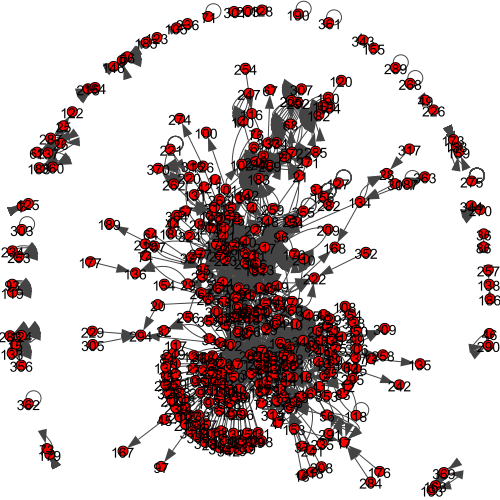

In [ ]:
#Visualize a new graph with numeric addresses

tuples = [tuple(x) for x in subset_WorksiteNumber.values]

g2 = ig.Graph.TupleList(tuples, directed=True, edge_attrs=['WorksiteAddress1', 'SupplierAddress1',
                                                           'WorksiteZip', 'SupplierZip','ProductNumber','VehicleType'])

visual_style = {}
visual_style["vertex_size"] = 10
#visual_style["vertex_color"] = [color_dict[product] for product in g2.es["ProductNumber"]]
visual_style["vertex_label"] = g2.vs["name"]
#visual_style["edge_width"] = [1 + 2 * int(is_formal) for is_formal in g2.es["is_formal"]]
#visual_style["layout"] =
visual_style["bbox"] = (500, 500)
visual_style["margin"] = 10
ig.plot(g2, **visual_style)

It is still hard to gain any information from this visualization because of the amount of information. Here it might be interesting to view if any other information from the subset would be interesting to investigate.

Looking at the subset we could use Zip-code as a representation of transportation.

In [ ]:
subset_Zip = subset_WorksiteNumber[['WorksiteZip','SupplierZip','WorksiteAddressNumber', 'SupplierAddressNumber','WorksiteAddress1','SupplierAddress1', 'ProductNumber',
                  'VehicleType', 'CustomerName']]
subset_Zip

,WorksiteZip,SupplierZip,WorksiteAddressNumber,SupplierAddressNumber,WorksiteAddress1,SupplierAddress1,ProductNumber,VehicleType,CustomerName
0,3230,4400,215,164,NAG Dønnevælde,Kalundborg Bulk Terminal,4100000,07S,Nordsj. Andels Grovvareforening A.M.B.A
1,3230,4400,215,164,NAG Dønnevælde,Kalundborg Bulk Terminal,4100000,07S,Nordsj. Andels Grovvareforening A.M.B.A
2,4000,4000,214,347,"Mole 240, Risø",Vestre Hedevej 25,540030,07S,Munck Havne & Anlæg A/S
3,3540,4000,54,96,Div. betalt på afd. 101,Gammel Marbjergvej 17,120099,7KJ,DSV Transport A/S entrepr.401
5,2300,4700,272,70,Selinevej 20,Elektrovej 4,965010,07S,Afatek A/S
...,...,...,...,...,...,...,...,...,...
2244,1438,4000,335,347,"Vandkulturhuset, Papirøen",Vestre Hedevej 25,506030,07S,MT Højgaard Danmark A/S
2245,4000,4000,357,371,"Værker ved Gevninge, Skullebjerg/Godtfreds Høje",Øde Hastrupvej 48,524010,07S,M.J. Eriksson Aktieselskab
2246,2450,4000,23,96,Borgmester Christiansens gade 41,Gammel Marbjergvej 17,170000,07S,Tunn3l JV I/S
2247,2450,4000,23,96,Borgmester Christiansens gade 41,Gammel Marbjergvej 17,170000,07S,Tunn3l JV I/S


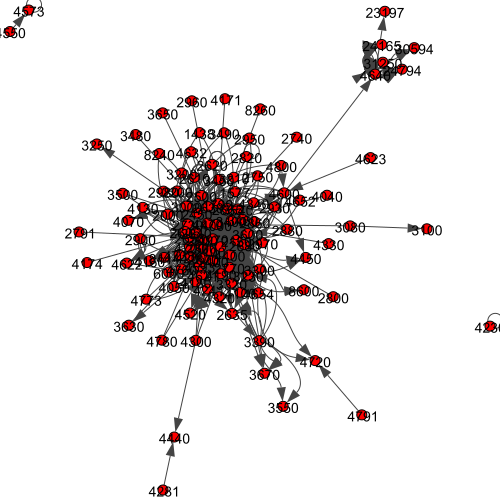

In [ ]:
#Visualization of Zip-code
tuples = [tuple(x) for x in subset_Zip.values]

g2 = ig.Graph.TupleList(tuples, directed=True, edge_attrs=['WorksiteAddressNumber', 'SupplierAddressNumber',
                                                           'WorksiteAddress1', 'SupplierAddress1','ProductNumber',
                                                          'VehicleType','CustomerName'])

visual_style = {}
visual_style["vertex_size"] = 10
visual_style["vertex_label"] = g2.vs["name"]
visual_style["bbox"] = (500, 500)
visual_style["margin"] = 10
ig.plot(g2, **visual_style)

Still hard to understand visulization because of the shown attributes of the vertices. Therefore it might be helpful to view it through different colors.

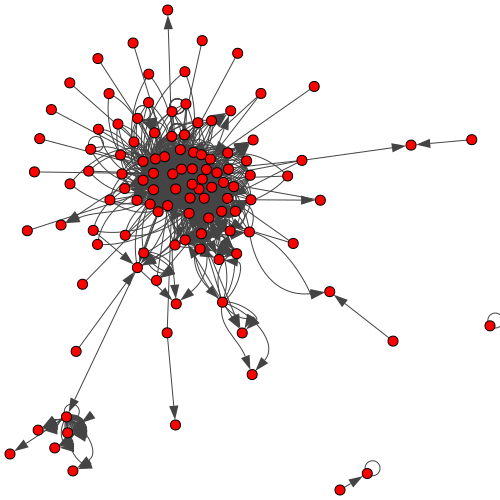

In [ ]:
#Zip-code graph without name attribute
visual_style = {}
visual_style["vertex_size"] = 10
visual_style["bbox"] = (500, 500)
visual_style["margin"] = 10
ig.plot(g2, **visual_style)

First we will try and color it based on the attribute of productnumber. Inverstigating how products are transported through both Zip and addresses

In [ ]:
#Create a list of ProductNumber
ProductNumber_list = list(subset_Zip.ProductNumber.unique())
print(len(ProductNumber_list))
ProductNumber_list

107


[4100000,
 540030,
 120099,
 965010,
 657010,
 501011,
 672030,
 612010,
 700665,
 506020,
 510020,
 674010,
 700650,
 524010,
 720000,
 499000,
 521010,
 500010,
 506030,
 642101,
 521011,
 160000,
 120000,
 770000,
 502030,
 527010,
 612022,
 658040,
 910010,
 170000,
 130600,
 800030,
 587061,
 518070,
 670020,
 700752,
 700660,
 850010,
 710002,
 710000,
 780000,
 655020,
 4100002,
 510100,
 521021,
 700000,
 550088,
 4105002,
 850020,
 120200,
 865010,
 518041,
 518012,
 587040,
 502092,
 504020,
 612020,
 260502,
 521018,
 700002,
 710001,
 140410,
 550038,
 550138,
 626020,
 895010,
 965030,
 800020,
 510042,
 440100,
 550118,
 546030,
 524031,
 510080,
 546010,
 745050,
 800040,
 592020,
 672020,
 651204,
 524011,
 745030,
 506110,
 699000,
 160100,
 550028,
 518011,
 915010,
 524021,
 150600,
 640072,
 170100,
 521031,
 518010,
 720001,
 548010,
 506040,
 855020,
 700640,
 955010,
 676010,
 640022,
 160200,
 912010,
 531010,
 546038,
 150000]

In [ ]:
#Create a list containing all colors that can be used by pycairo
colors = [u'#FFB6C1', u'#FFC0CB', u'#DC143C', u'#FFF0F5', u'#DB7093', u'#FF69B4', u'#FF1493', u'#C71585',
    u'#DA70D6', u'#D8BFD8', u'#DDA0DD', u'#EE82EE', u'#FF00FF', u'#FF00FF', u'#8B008B', u'#800080',
    u'#BA55D3', u'#9400D3', u'#9932CC', u'#4B0082', u'#8A2BE2', u'#9370DB', u'#7B68EE', u'#6A5ACD',
    u'#483D8B', u'#F8F8FF', u'#E6E6FA', u'#0000FF', u'#0000CD', u'#00008B', u'#000080', u'#191970',
    u'#4169E1', u'#6495ED', u'#B0C4DE', u'#778899', u'#708090', u'#1E90FF', u'#F0F8FF', u'#4682B4',
    u'#87CEFA', u'#87CEEB', u'#00BFFF', u'#ADD8E6', u'#B0E0E6', u'#5F9EA0', u'#00CED1', u'#F0FFFF',
    u'#E0FFFF', u'#AFEEEE', u'#00FFFF', u'#00FFFF', u'#008B8B', u'#008080', u'#2F4F4F', u'#48D1CC',
    u'#20B2AA', u'#40E0D0', u'#7FFFD4', u'#66CDAA', u'#00FA9A', u'#F5FFFA', u'#00FF7F', u'#3CB371',
    u'#2E8B57', u'#F0FFF0', u'#8FBC8F', u'#98FB98', u'#90EE90', u'#32CD32', u'#00FF00', u'#228B22',
    u'#008000', u'#006400', u'#7CFC00', u'#7FFF00', u'#ADFF2F', u'#556B2F', u'#9ACD32', u'#6B8E23',
    u'#FFFFF0', u'#F5F5DC', u'#FFFFE0', u'#FAFAD2', u'#FFFF00', u'#808000', u'#BDB76B', u'#EEE8AA',
    u'#FFFACD', u'#F0E68C', u'#FFD700', u'#FFF8DC', u'#DAA520', u'#B8860B', u'#FFFAF0', u'#FDF5E6',
    u'#F5DEB3', u'#FFA500', u'#FFE4B5', u'#FFEFD5', u'#FFEBCD', u'#FFDEAD', u'#FAEBD7', u'#D2B48C',
    u'#DEB887', u'#FF8C00', u'#FFE4C4', u'#FAF0E6', u'#CD853F', u'#FFDAB9', u'#F4A460', u'#D2691E',
    u'#8B4513', u'#FFF5EE', u'#A0522D', u'#FFA07A', u'#FF7F50', u'#FF4500', u'#E9967A', u'#FF6347',
    u'#FA8072', u'#FFE4E1', u'#F08080', u'#FFFAFA', u'#BC8F8F', u'#CD5C5C', u'#FF0000', u'#A52A2A',
    u'#B22222', u'#8B0000', u'#800000', u'#FFFFFF', u'#F5F5F5', u'#DCDCDC', u'#D3D3D3', u'#C0C0C0',
    u'#A9A9A9', u'#808080', u'#696969', u'#000000']

In [ ]:
#Make the two into a dictionary
PN_color_dict = dict(zip(ProductNumber_list, colors))
PN_color_dict

{4100000: '#FFB6C1',
 540030: '#FFC0CB',
 120099: '#DC143C',
 965010: '#FFF0F5',
 657010: '#DB7093',
 501011: '#FF69B4',
 672030: '#FF1493',
 612010: '#C71585',
 700665: '#DA70D6',
 506020: '#D8BFD8',
 510020: '#DDA0DD',
 674010: '#EE82EE',
 700650: '#FF00FF',
 524010: '#FF00FF',
 720000: '#8B008B',
 499000: '#800080',
 521010: '#BA55D3',
 500010: '#9400D3',
 506030: '#9932CC',
 642101: '#4B0082',
 521011: '#8A2BE2',
 160000: '#9370DB',
 120000: '#7B68EE',
 770000: '#6A5ACD',
 502030: '#483D8B',
 527010: '#F8F8FF',
 612022: '#E6E6FA',
 658040: '#0000FF',
 910010: '#0000CD',
 170000: '#00008B',
 130600: '#000080',
 800030: '#191970',
 587061: '#4169E1',
 518070: '#6495ED',
 670020: '#B0C4DE',
 700752: '#778899',
 700660: '#708090',
 850010: '#1E90FF',
 710002: '#F0F8FF',
 710000: '#4682B4',
 780000: '#87CEFA',
 655020: '#87CEEB',
 4100002: '#00BFFF',
 510100: '#ADD8E6',
 521021: '#B0E0E6',
 700000: '#5F9EA0',
 550088: '#00CED1',
 4105002: '#F0FFFF',
 850020: '#E0FFFF',
 120200: '#AFEEEE

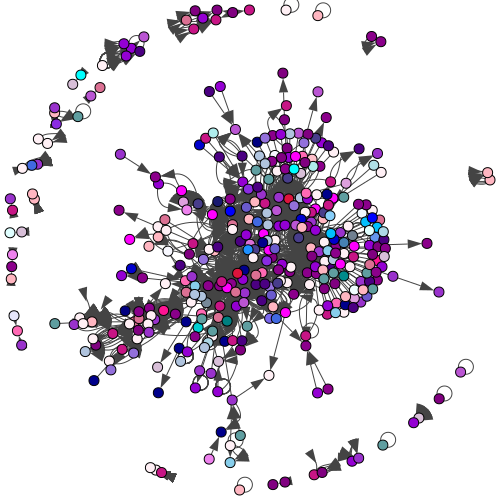

In [ ]:
#Visualization of address; colored by productnumber
df_test = subset_WorksiteNumber[['WorksiteAddressNumber', 'SupplierAddressNumber','WorksiteAddress1','SupplierAddress1','WorksiteZip','SupplierZip', 'ProductNumber',
                  'VehicleType', 'CustomerName']]

tuples = [tuple(x) for x in df_test.values]

g2 = ig.Graph.TupleList(tuples, directed=True, edge_attrs=['WorksiteAddress1', 'SupplierAddress1',
                                                           'WorksiteZip', 'SupplierZip','ProductNumber','VehicleType','CustomerName'])

visual_style = {}
visual_style["vertex_size"] = 10
visual_style["vertex_color"] = [PN_color_dict[product] for product in g2.es["ProductNumber"]]
visual_style["bbox"] = (500, 500)
visual_style["margin"] = 10
ig.plot(g2, **visual_style)

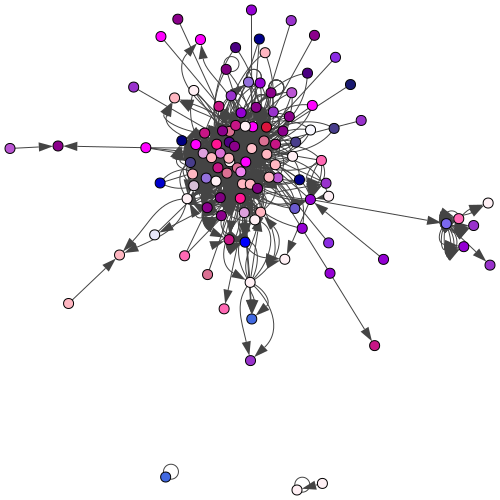

In [ ]:
#Visualization of Zip-code; colored by productnumber
df_test = subset_Zip[['WorksiteZip','SupplierZip','WorksiteAddressNumber', 'SupplierAddressNumber','WorksiteAddress1','SupplierAddress1', 'ProductNumber',
                  'VehicleType', 'CustomerName']]

tuples = [tuple(x) for x in df_test.values]

g2 = ig.Graph.TupleList(tuples, directed=True, edge_attrs=['WorksiteAddressNumber', 'SupplierAddressNumber',
                                                           'WorksiteAddress1', 'SupplierAddress1','ProductNumber',
                                                          'VehicleType','CustomerName'])

visual_style = {}
visual_style["vertex_size"] = 10
visual_style["vertex_color"] = [PN_color_dict[product] for product in g2.es["ProductNumber"]]
#visual_style["vertex_label"] = g2.vs["name"]
#visual_style["edge_width"] = [1 + 2 * int(is_formal) for is_formal in g2.es["is_formal"]]
#visual_style["layout"] =
visual_style["bbox"] = (500, 500)
visual_style["margin"] = 10
ig.plot(g2, **visual_style)

Create color dictionary for Vehicletype

In [ ]:
VehicleType_list = list(df_test.VehicleType.unique())
print(len(VehicleType_list))
VehicleType_list

16


['07S',
 '7KJ',
 '7FH',
 '06S',
 '7K',
 '06WF',
 '6SJ',
 'HL',
 '07SA',
 '7KA',
 '7GKA',
 '06CA',
 '7GK',
 '05SA',
 4,
 '4F']

In [ ]:
Veh_color_dict = dict(zip(VehicleType_list, colors))
Veh_color_dict

{'07S': '#FFB6C1',
 '7KJ': '#FFC0CB',
 '7FH': '#DC143C',
 '06S': '#FFF0F5',
 '7K': '#DB7093',
 '06WF': '#FF69B4',
 '6SJ': '#FF1493',
 'HL': '#C71585',
 '07SA': '#DA70D6',
 '7KA': '#D8BFD8',
 '7GKA': '#DDA0DD',
 '06CA': '#EE82EE',
 '7GK': '#FF00FF',
 '05SA': '#FF00FF',
 4: '#8B008B',
 '4F': '#800080'}

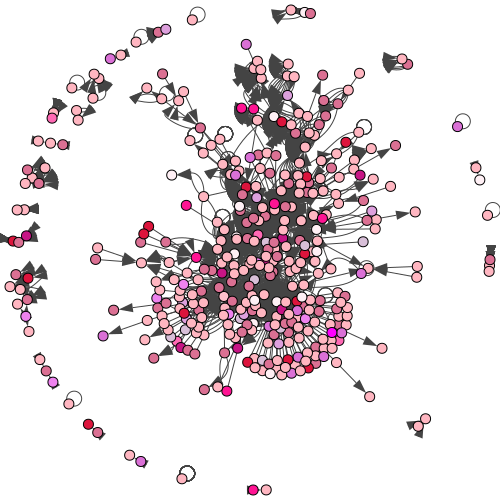

In [ ]:
#Visualization of address; colored by vehicletype
df_test = subset_WorksiteNumber[['WorksiteAddressNumber', 'SupplierAddressNumber','WorksiteAddress1','SupplierAddress1','WorksiteZip','SupplierZip', 'ProductNumber',
                  'VehicleType', 'CustomerName']]

tuples = [tuple(x) for x in df_test.values]

g2 = ig.Graph.TupleList(tuples, directed=True, edge_attrs=['WorksiteAddress1', 'SupplierAddress1',
                                                           'WorksiteZip', 'SupplierZip','ProductNumber','VehicleType','CustomerName'])

visual_style = {}
visual_style["vertex_size"] = 10
visual_style["vertex_color"] = [Veh_color_dict[v] for v in g2.es["VehicleType"]]
#visual_style["vertex_label"] = g2.vs["name"]
#visual_style["edge_width"] = [1 + 2 * int(is_formal) for is_formal in g2.es["is_formal"]]
#visual_style["layout"] =
visual_style["bbox"] = (500, 500)
visual_style["margin"] = 10
ig.plot(g2, **visual_style)

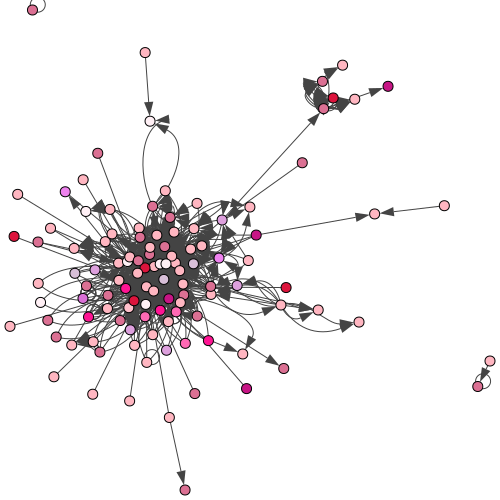

In [ ]:
#Visualization of Zip-code; colored by vehicletype
df_test = subset_Zip[['WorksiteZip','SupplierZip','WorksiteAddressNumber', 'SupplierAddressNumber','WorksiteAddress1','SupplierAddress1', 'ProductNumber',
                  'VehicleType', 'CustomerName']]

tuples = [tuple(x) for x in df_test.values]

g2 = ig.Graph.TupleList(tuples, directed=True, edge_attrs=['WorksiteAddressNumber', 'SupplierAddressNumber',
                                                           'WorksiteAddress1', 'SupplierAddress1','ProductNumber',
                                                          'VehicleType','CustomerName'])

visual_style = {}
visual_style["vertex_size"] = 10
visual_style["vertex_color"] = [Veh_color_dict[v] for v in g2.es["VehicleType"]]
#visual_style["vertex_label"] = g2.vs["name"]
#visual_style["edge_width"] = [1 + 2 * int(is_formal) for is_formal in g2.es["is_formal"]]
#visual_style["layout"] =
visual_style["bbox"] = (500, 500)
visual_style["margin"] = 10
ig.plot(g2, **visual_style)

Create color dictionary for CustomerName

In [ ]:
CustomerName_list = list(df_test.CustomerName.unique())
print(len(CustomerName_list))
CustomerName_list

114


['Nordsj. Andels Grovvareforening A.M.B.A',
 'Munck Havne & Anlæg A/S',
 'DSV Transport A/S entrepr.401',
 'Afatek A/S',
 'Solum Roskilde A/S',
 'Green-Anlæg ApS',
 'Hansen & Søn Transport ApS',
 'Per Aarsleff A/S',
 'Norrecco A/S',
 'Baltic Shipping Company A/S',
 'OK Entreprise ApS',
 'LT Asfalt A/S',
 'VML Entreprise ApS',
 'NCC Industry A/S',
 'RGS Nordic A/S',
 'Arkil  A/S',
 'Brdr. Christensen, Ikast A/S',
 'Brdr. K. Hansen A/S',
 'Kongeskov A/S',
 'Bøgelund V/ Peter Bøgelund',
 'MSE Entreprise A/S',
 'Uniplan Danmark A/S',
 'Johannes Fraas ApS',
 'Thorebogaard P/S',
 'CG Jensen A/S',
 'MT Højgaard Danmark A/S',
 'M.J. Eriksson Aktieselskab',
 'Matic V/ Niels Haubroe',
 'Arentfeld A/S',
 'Stark',
 'Elindco Byggefirma A/S',
 'Karise Anlæg- & Byg A/S',
 'AV Miljø I/S',
 'Aarsleff Rail A/S',
 'Erling Huge Hansen',
 'Allerød Transporten A/S',
 'Sydkystens Privatskole',
 'Fredensborg Vand A/S',
 'Jakob Filbert, Anlægsgartner',
 '4700 ApS',
 'Meldgaard Miljø A/S',
 'Ebbe Dalsgaard A/S'

In [ ]:
CN_color_dict = dict(zip(CustomerName_list, colors))
CN_color_dict

{'Nordsj. Andels Grovvareforening A.M.B.A': '#FFB6C1',
 'Munck Havne & Anlæg A/S': '#FFC0CB',
 'DSV Transport A/S entrepr.401': '#DC143C',
 'Afatek A/S': '#FFF0F5',
 'Solum Roskilde A/S': '#DB7093',
 'Green-Anlæg ApS': '#FF69B4',
 'Hansen & Søn Transport ApS': '#FF1493',
 'Per Aarsleff A/S': '#C71585',
 'Norrecco A/S': '#DA70D6',
 'Baltic Shipping Company A/S': '#D8BFD8',
 'OK Entreprise ApS': '#DDA0DD',
 'LT Asfalt A/S': '#EE82EE',
 'VML Entreprise ApS': '#FF00FF',
 'NCC Industry A/S': '#FF00FF',
 'RGS Nordic A/S': '#8B008B',
 'Arkil  A/S': '#800080',
 'Brdr. Christensen, Ikast A/S': '#BA55D3',
 'Brdr. K. Hansen A/S': '#9400D3',
 'Kongeskov A/S': '#9932CC',
 'Bøgelund V/ Peter Bøgelund': '#4B0082',
 'MSE Entreprise A/S': '#8A2BE2',
 'Uniplan Danmark A/S': '#9370DB',
 'Johannes Fraas ApS': '#7B68EE',
 'Thorebogaard P/S': '#6A5ACD',
 'CG Jensen A/S': '#483D8B',
 'MT Højgaard Danmark A/S': '#F8F8FF',
 'M.J. Eriksson Aktieselskab': '#E6E6FA',
 'Matic V/ Niels Haubroe': '#0000FF',
 'Arentf

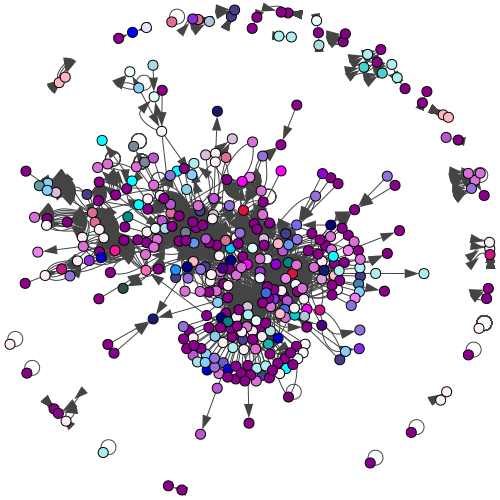

In [ ]:
#Visualization of address; colored by CustomerName

df_test = subset_WorksiteNumber[['WorksiteAddressNumber', 'SupplierAddressNumber','WorksiteAddress1','SupplierAddress1','WorksiteZip','SupplierZip', 'ProductNumber',
                  'VehicleType', 'CustomerName']]

tuples = [tuple(x) for x in df_test.values]

g2 = ig.Graph.TupleList(tuples, directed=True, edge_attrs=['WorksiteAddress1', 'SupplierAddress1',
                                                           'WorksiteZip', 'SupplierZip','ProductNumber','VehicleType','CustomerName'])

visual_style = {}
visual_style["vertex_size"] = 10
visual_style["vertex_color"] = [CN_color_dict[v] for v in g2.es["CustomerName"]]
#visual_style["vertex_label"] = g2.vs["name"]
#visual_style["edge_width"] = [1 + 2 * int(is_formal) for is_formal in g2.es["is_formal"]]
#visual_style["layout"] =
visual_style["bbox"] = (500, 500)
visual_style["margin"] = 10
ig.plot(g2, **visual_style)

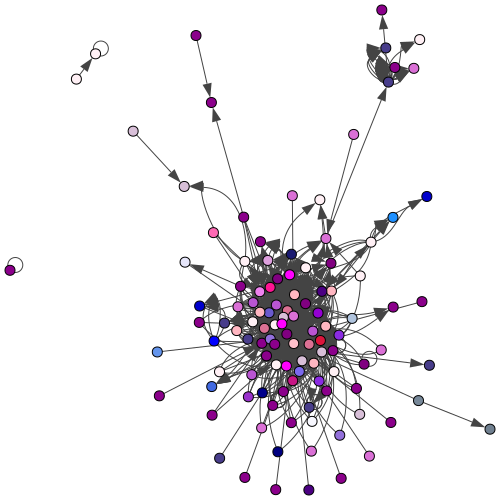

In [ ]:
#Visualization of Zip-code; colored by CustomerName

df_test = subset_Zip[['WorksiteZip','SupplierZip','WorksiteAddressNumber', 'SupplierAddressNumber','WorksiteAddress1','SupplierAddress1', 'ProductNumber',
                  'VehicleType', 'CustomerName']]
df_test

tuples = [tuple(x) for x in df_test.values]

g2 = ig.Graph.TupleList(tuples, directed=True, edge_attrs=['WorksiteAddressNumber', 'SupplierAddressNumber',
                                                           'WorksiteAddress1', 'SupplierAddress1','ProductNumber',
                                                          'VehicleType','CustomerName'])

visual_style = {}
visual_style["vertex_size"] = 10
visual_style["vertex_color"] = [CN_color_dict[v] for v in g2.es["CustomerName"]]
#visual_style["vertex_label"] = g2.vs["name"]
#visual_style["edge_width"] = [1 + 2 * int(is_formal) for is_formal in g2.es["is_formal"]]
#visual_style["layout"] =
visual_style["bbox"] = (500, 500)
visual_style["margin"] = 10
ig.plot(g2, **visual_style)

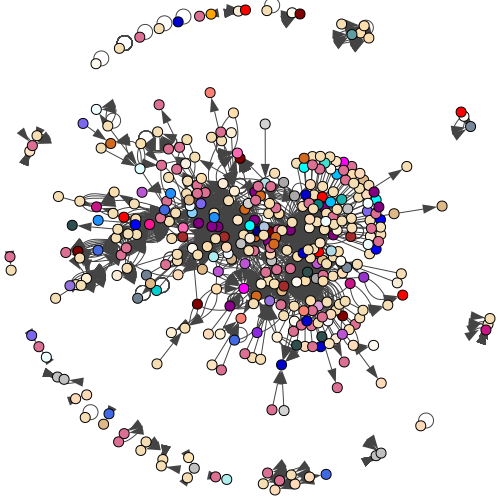

In [ ]:
#Visualization of address; colored by Zip-code
df_test = subset_WorksiteNumber[['WorksiteAddressNumber', 'SupplierAddressNumber','WorksiteAddress1','SupplierAddress1','WorksiteZip','SupplierZip', 'ProductNumber',
                  'VehicleType', 'CustomerName']]

tuples = [tuple(x) for x in df_test.values]

g2 = ig.Graph.TupleList(tuples, directed=True, edge_attrs=['WorksiteAddress1', 'SupplierAddress1',
                                                           'WorksiteZip', 'SupplierZip','ProductNumber','VehicleType','CustomerName'])
workzip_list = list(df_test.WorksiteZip.unique()) + list(df_test.SupplierZip.unique())
zip_color_dict = dict(zip(workzip_list, colors))


visual_style = {}
visual_style["vertex_size"] = 10
visual_style["vertex_color"] = [zip_color_dict[v] for v in g2.es["WorksiteZip"]]
#visual_style["vertex_label"] = g2.vs["name"]
#visual_style["edge_width"] = [1 + 2 * int(is_formal) for is_formal in g2.es["is_formal"]]
#visual_style["layout"] =
visual_style["bbox"] = (500, 500)
visual_style["margin"] = 10
ig.plot(g2, **visual_style)

This might be a good place to start. Through these visulizations you are able to gain an overview of the dataframe. Through these visualization you can find outliers that might be interesting to look at